In [14]:
import numpy as np
import pandas as pd
import os,json
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import imagehash
import torch
import glob

# for terminal bar
from tqdm.auto import tqdm
from PIL import Image

In [15]:
base_path="../input/cassava-leaf-disease-classification/"
with open(os.path.join(base_path,"label_num_to_disease_map.json"),'r')  as f:
    classes=json.load(f)
    classes={ int(k) : v for k,v in classes.items() }

print(classes)

{0: 'Cassava Bacterial Blight (CBB)', 1: 'Cassava Brown Streak Disease (CBSD)', 2: 'Cassava Green Mottle (CGM)', 3: 'Cassava Mosaic Disease (CMD)', 4: 'Healthy'}


In [16]:
df=pd.read_csv(base_path+"train.csv")
df["disease"]=df.label.map(classes)

df.head(10)

,image_id,label,disease
0,1000015157.jpg,0,Cassava Bacterial Blight (CBB)
1,1000201771.jpg,3,Cassava Mosaic Disease (CMD)
2,100042118.jpg,1,Cassava Brown Streak Disease (CBSD)
3,1000723321.jpg,1,Cassava Brown Streak Disease (CBSD)
4,1000812911.jpg,3,Cassava Mosaic Disease (CMD)
5,1000837476.jpg,3,Cassava Mosaic Disease (CMD)
6,1000910826.jpg,2,Cassava Green Mottle (CGM)
7,1001320321.jpg,0,Cassava Bacterial Blight (CBB)
8,1001723730.jpg,4,Healthy
9,1001742395.jpg,3,Cassava Mosaic Disease (CMD)


In [17]:
label_count=df.disease.value_counts()
diseases=list(label_count.index)

print(label_count)

Cassava Mosaic Disease (CMD)           13158
Healthy                                 2577
Cassava Green Mottle (CGM)              2386
Cassava Brown Streak Disease (CBSD)     2189
Cassava Bacterial Blight (CBB)          1087
Name: disease, dtype: int64


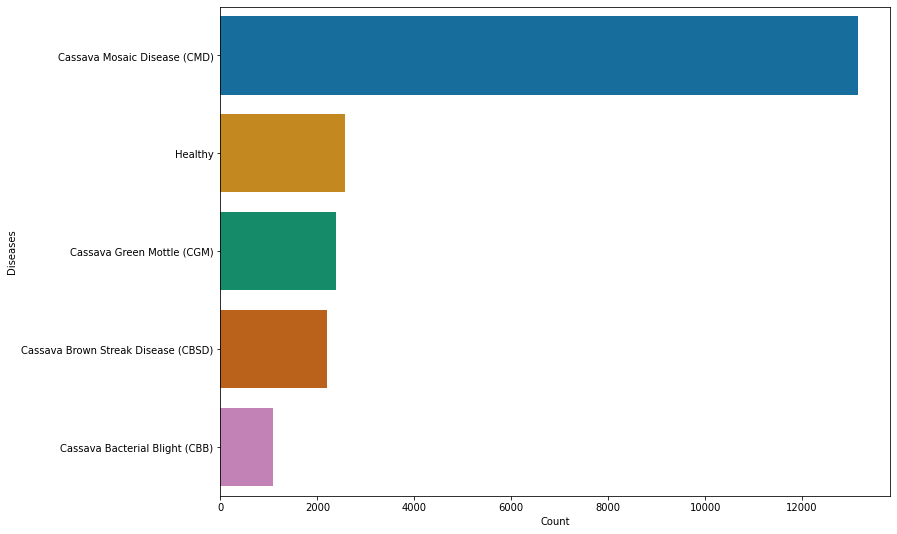

In [96]:
fig,ax=plt.subplots(1,1,figsize=(12,9))
ax=sns.barplot(x=label_count.values,y=label_count.index,palette="colorblind")
plt.xlabel("Count")
plt.ylabel("Diseases")

plt.show()

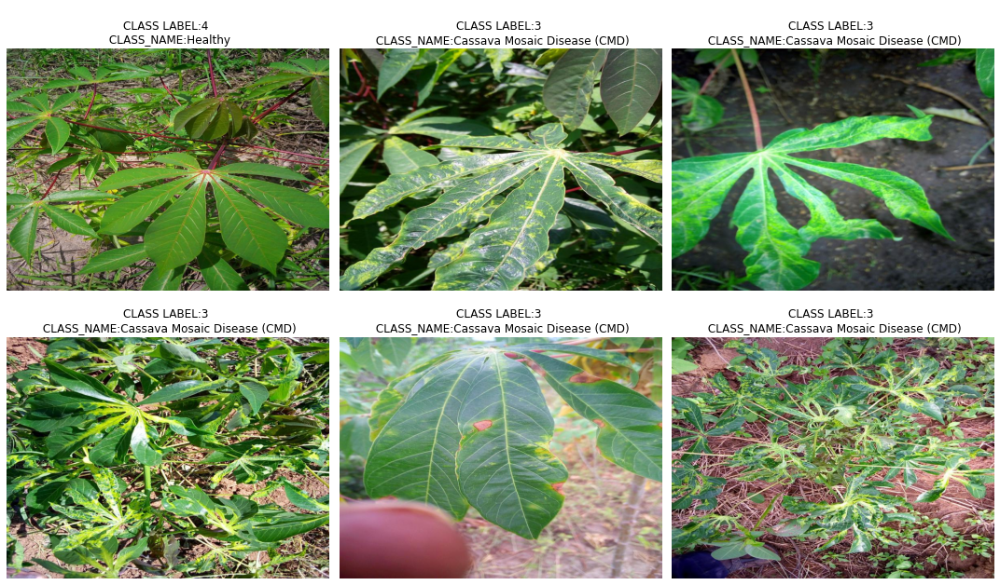

In [88]:
def plot_batch(data=df):
    plt.figure(figsize=(15,9))
    
    for i in range(6):
        k=np.random.randint(0,len(data))
        image=cv2.imread(base_path+"train_images/"+data.image_id[k])
        image=cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        
        plt.subplot(2,3,i+1)
        plt.imshow(image)
        plt.axis("off")
        plt.title(f"\nCLASS LABEL:{data.label[k]} \n CLASS_NAME:{data.disease[k]}")
        
    plt.tight_layout()
    plt.show()

plot_batch()
    

Cassava Bacterial Blight (CBB)


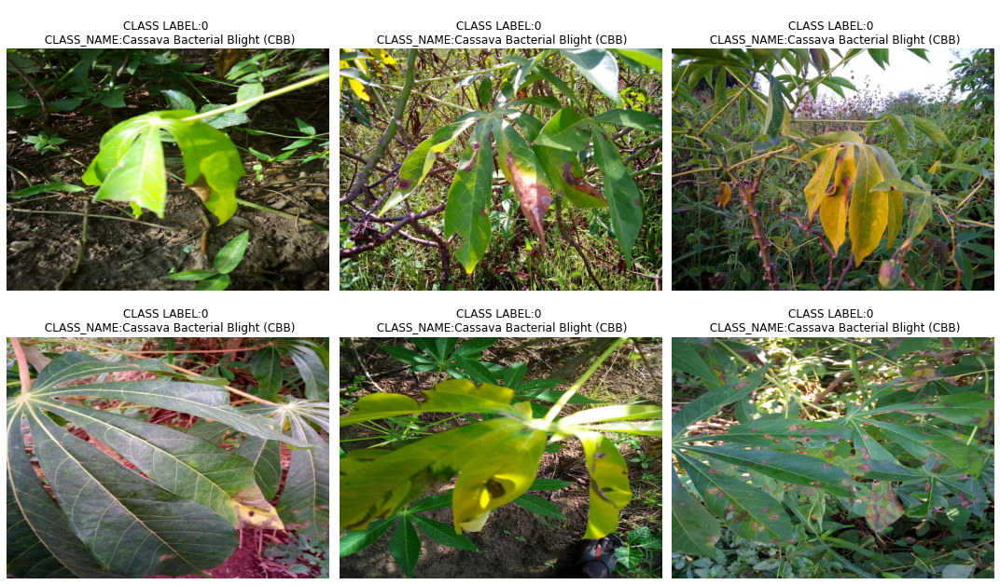

In [73]:
temp_data=df.loc[df.label==0]
print(temp_data.disease.iloc[0])
temp_data.reset_index(inplace=True)
plot_batch(temp_data)

Cassava Brown Streak Disease (CBSD)


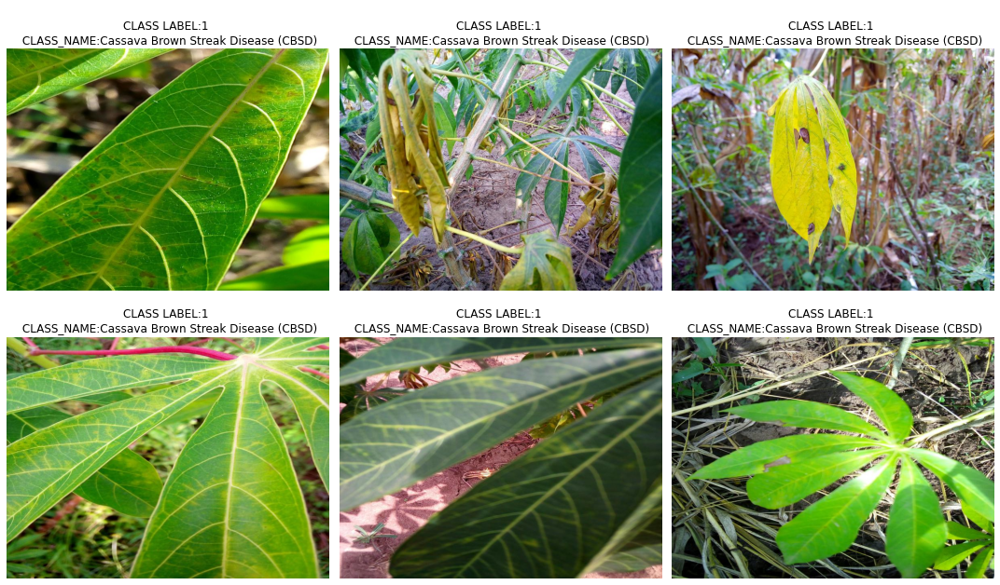

In [74]:
temp_data=df.loc[df.label==1]
print(temp_data.disease.iloc[0])
temp_data.reset_index(inplace=True)
plot_batch(temp_data)

Cassava Green Mottle (CGM)


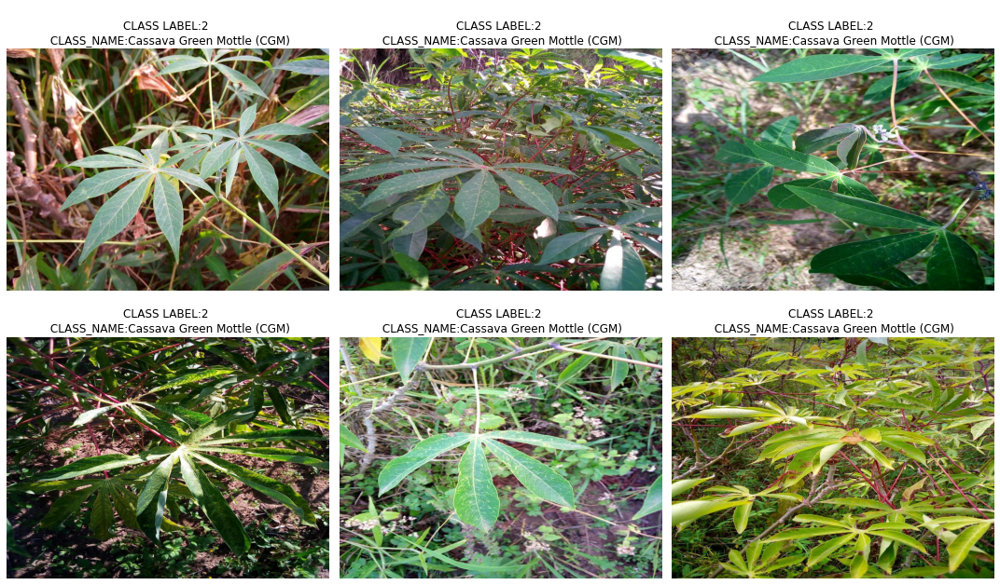

In [75]:
temp_data=df.loc[df.label==2]
print(temp_data.disease.iloc[0])
temp_data.reset_index(inplace=True)
plot_batch(temp_data)

Cassava Mosaic Disease (CMD)


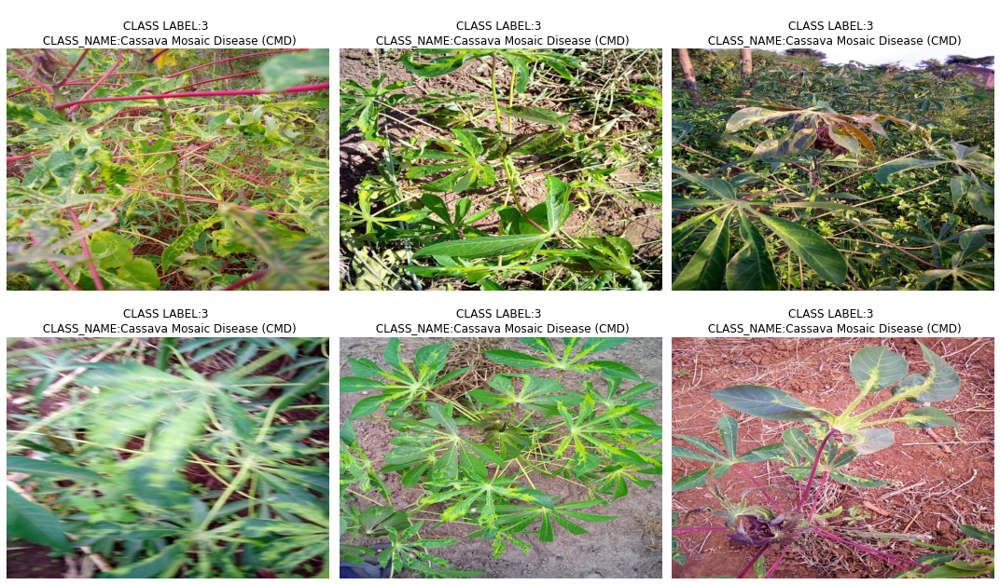

In [76]:
temp_data=df.loc[df.label==3]
print(temp_data.disease.iloc[0])
temp_data.reset_index(inplace=True)
plot_batch(temp_data)

Healthy


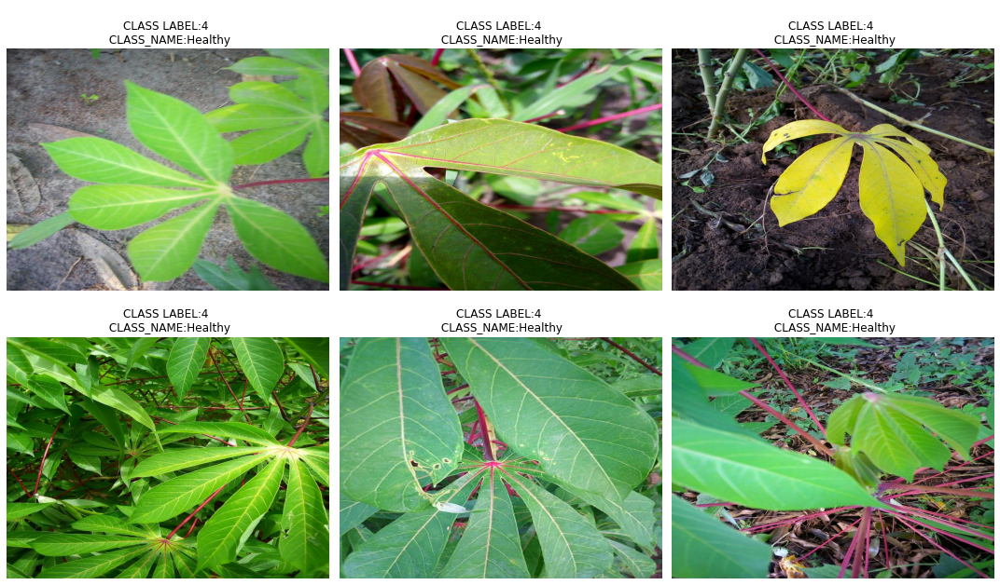

In [77]:
temp_data=df.loc[df.label==4]
print(temp_data.disease.iloc[0])
temp_data.reset_index(inplace=True)
plot_batch(temp_data)

In [78]:
hash_functions=[
    imagehash.average_hash,
    imagehash.phash,
    imagehash.dhash,
    imagehash.whash
]

image_ids=[]
hashes=[]

for path in tqdm(glob.glob(base_path+"train_images/"+"*.jpg")):
    image=Image.open(path)
    image_id=os.path.basename(path)
    
    image_ids.append(image_id)
    hashes.append(np.array([f(image).hash for f in hash_functions]).reshape(256))
    
hashes_all=np.array(hashes)    

  0%|          | 0/21397 [00:00<?, ?it/s]

In [79]:
hash_comparison = np.array([np.sum(hashes_output[i]==hashes_output ,axis=1)/hashes_all.shape[1] for i in tqdm(range(hashes_all.shape[0]))])
                            
indices1 = np.where(sims > 0.9)
indices2 = np.where(indices1[0] != indices1[1])
image_ids1 = [image_ids[i] for i in indices1[0][indices2]]
image_ids2 = [image_ids[i] for i in indices1[1][indices2]]
duplicate_image_ids = {tuple(sorted([image_id1,image_id2])):True for image_id1, image_id2 in zip(image_ids1, image_ids2)}
print('found %d duplicates' % len(dups))

duplicate_image_ids = sorted(list(dups))

  0%|          | 0/21397 [00:00<?, ?it/s]

found 2 duplicates


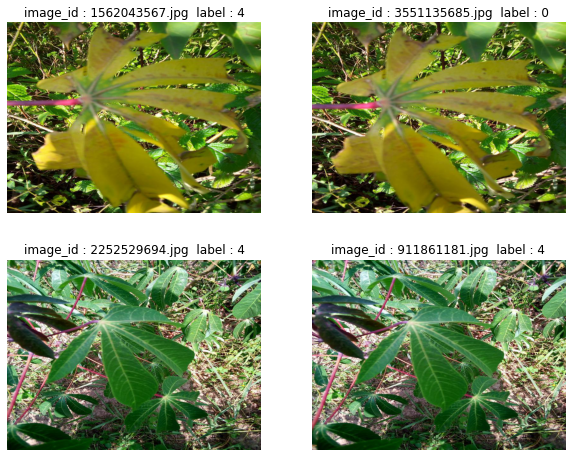

In [87]:
fig, axs = plt.subplots(2, 2, figsize=(10,8))

for row in range(2):
        for col in range(2):
            img_id = duplicate_image_ids[row][col]
            img = Image.open(base_path+ "/train_images/" + img_id)
            label =str(df.loc[df['image_id'] == img_id].label.values[0])
            axs[row, col].imshow(img)
            axs[row, col].set_title("image_id : "+ img_id + "  label : " + label)
            axs[row, col].axis('off')

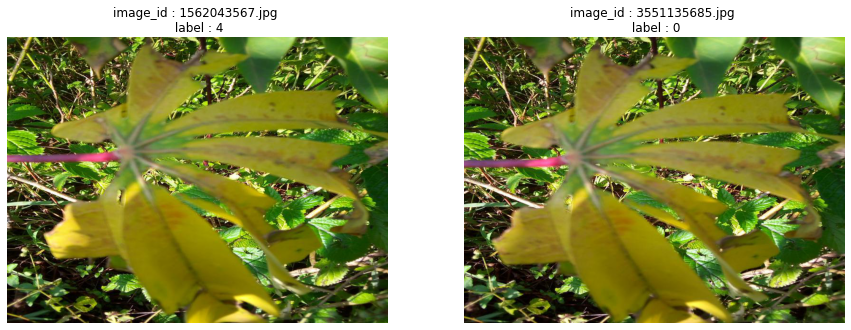

In [93]:
fig, axs = plt.subplots(1, 2, figsize=(15,15))
for col in range(2):
    img_id = duplicate_image_ids[0][col]
    img = Image.open(base_path+ "/train_images/" + img_id)
    label =str(df.loc[df['image_id'] == img_id].label.values[0])
    axs[col].imshow(img)
    axs[col].set_title("image_id : "+ img_id + " \n label : " + label)
    axs[col].axis('off')